# Library Import

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import ydata_profiling as pp 
from ydata_profiling import ProfileReport

%matplotlib inline
import time
import random

import geopy
from geopy.geocoders import Nominatim #OpenStreetMaps's API conection
# API Requests user-agent ID
useragent="javier.duarte@mi.unc.edu.ar"  
geolocator = Nominatim(user_agent=useragent) 

import folium
import json
from folium import plugins

from geopy.extra.rate_limiter import RateLimiter
from functools import partial  # esto es para poder darle argumentos a geocode dentro del .apply ver documentacion, funciona como un pipeline

import geopandas as gpd
from shapely.geometry import Point, Polygon
sns.set_theme()

# Database Import

In [2]:
df_original = pd.read_excel("../Databases/CasasJulio2022.xlsx")

---

# Exploratory Data Analysis

## EDA Tool - YData-Profiling

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

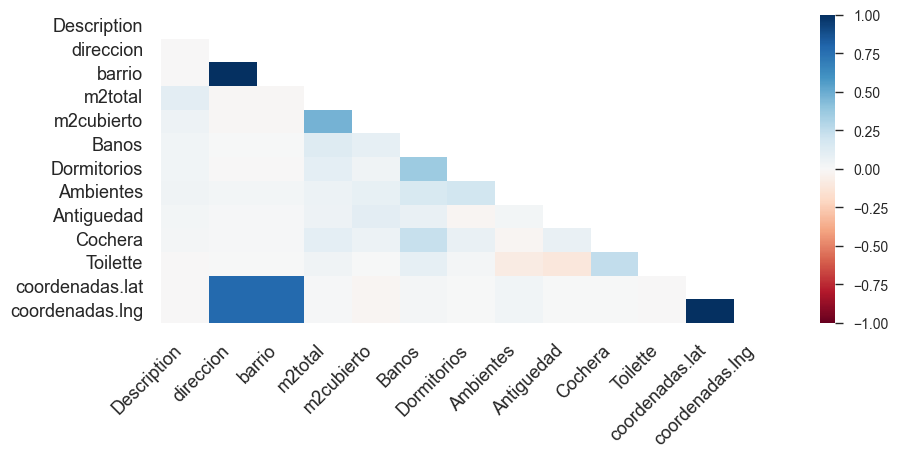

In [3]:
pp.ProfileReport(df_original)

## Data Cleaning Tasks

### 1) Elimination of Duplicate Records

In [4]:
df1=df_original.drop_duplicates()
df1=df1.reset_index(drop=True)

---

### Antiquity Variable Corrections

There are:
- 29 Records given by the year of contruction of the houses
- 4974 Records given by the age of the property

Only the second criterion will be used

In [5]:
print("Age of construction:", df1[df1["Antiguedad"]>1900].shape[0])
print("Property's age:", df1[df1["Antiguedad"]<400].shape[0])

Age of construction: 29
Property's age: 4974


In [6]:
indices=df1[df1["Antiguedad"]>1900].index
for i in indices:
    df1.iloc[i,9]=2022-df1.iloc[i,9]

### Spatial Coordinates Format Corrections

In [7]:
df1["coordenadas.lat"]=df1["coordenadas.lat"]*1.0e-15
df1["coordenadas.lng"]=df1["coordenadas.lng"]*1.0e-15

---

### Recovery Missing Data - Variable "Descripción"

A "keywords" search was implemented to find new analysis variables

Note: It´s necesary that the "Decripción" variable does not has NaN records

In [8]:
import unicodedata

In [9]:
# Define functions for text manipulation - Normalize Unstructured Data and Build Histograms
def normalize(c):
    return unicodedata.normalize("NFD",c)[0]

###################################################################################################

#creo una funcion de python que procesa el texto
def procesado_texto(texto,no_deseados):
    for i in no_deseados:
        texto=texto.replace(i," ")

    palabras=texto.lower().split(" ")

    palabras_sin_tilde=[]
    for data in palabras:
        data = ''.join(normalize(c) for c in str(data))
        palabras_sin_tilde.append(data)

    palabras_final=[]
    for i in palabras_sin_tilde:
        if (i != "") & (i != " "):
            palabras_final.append(i)
    
    return palabras_final

###################################################################################################

#Genera un diccionario con Elementos de una lista y su frecuencia absoluta
def count_elements(seq) -> dict:
    """Tally elements from `seq`."""
    hist = {}
    for i in seq:
        hist[i] = hist.get(i, 0) + 1
    return hist


In [10]:
# List with characters that are NOT wanted
lista_no_deseados=[" " , ",", "(",")","[","]",":",";","-","_",".","*","+","\n","/","!"]

In [11]:
# Banos Variable Missing Values
df1_nobanos= df1[(df1["Banos"].isnull()) & (df1["Description"].notnull()) ]

lista_indices_banos=[]
for des,indice in  zip(df1_nobanos["Description"].values , df1_nobanos["Description"].index):
    listapalabras=procesado_texto(des,lista_no_deseados)
    k=0
    for i in listapalabras:
        if (i == "bano") | (i == "banos"):
            k=k+1
    if (k != 0):
        lista_indices_banos.append(indice)
print("Registros que se podrian recuperar:" , len(lista_indices_banos))

Registros que se podrian recuperar: 187


In [12]:
# Cochera Variable Missing Values
df1_nocochera= df1[(df1["Cochera"].isnull()) & (df1["Description"].notnull()) ]

lista_indices_cochera=[]
for des,indice in  zip(df1_nocochera["Description"].values , df1_nocochera["Description"].index):
    listapalabras=procesado_texto(des,lista_no_deseados)
    k=0
    for i in listapalabras:
        if (i == "cochera") | (i == "cocheras"):
            k=k+1
    if (k != 0):
        lista_indices_cochera.append(indice)
print("Registros que se podrian recuperar:" , len(lista_indices_cochera))

Registros que se podrian recuperar: 948


In [13]:
# Dormitorios Variable Missing Values
df1_nodormit= df1[(df1["Dormitorios"].isnull()) & (df1["Description"].notnull()) ]

lista_indices_dormit=[]
for des,indice in  zip(df1_nodormit["Description"].values , df1_nodormit["Description"].index):
    listapalabras=procesado_texto(des,lista_no_deseados)
    k=0
    for i in listapalabras:
        if (i == "dormitorio") | (i == "dormitorios"):
            k=k+1
    if (k != 0):
        lista_indices_dormit.append(indice)
print("Registros que se podrian recuperar:" , len(lista_indices_dormit))

Registros que se podrian recuperar: 159


In [14]:
# Toilette Variable Missing Values
df1_notoilette= df1[(df1["Toilette"].isnull()) & (df1["Description"].notnull()) ]

lista_indices_toilette=[]
for des,indice in  zip(df1_notoilette["Description"].values , df1_notoilette["Description"].index):
    listapalabras=procesado_texto(des,lista_no_deseados)
    k=0
    for i in listapalabras:
        if (i == "toilette") | (i == "toilettes"):
            k=k+1
    if (k != 0):
        lista_indices_toilette.append(indice)
print("Registros que se podrian recuperar:" , len(lista_indices_toilette))

Registros que se podrian recuperar: 702


In [15]:
# Ambientes Variable Missing Values
df1_noambientes= df1[(df1["Ambientes"].isnull()) & (df1["Description"].notnull()) ]

lista_indices_ambientes=[]
for des,indice in  zip(df1_noambientes["Description"].values , df1_noambientes["Description"].index):
    listapalabras=procesado_texto(des,lista_no_deseados)
    k=0
    for i in listapalabras:
        if (i == "ambiente") | (i == "ambientes"):
            k=k+1
    if (k != 0):
        lista_indices_ambientes.append(indice)
print("Registros que se podrian recuperar:" , len(lista_indices_ambientes))

Registros que se podrian recuperar: 103


---

In [16]:
# Missing Values count before data-entry tasks 
for i in df1.columns:
    nulos=df1[i].isnull().sum()
    print(f"{i} -- {nulos} -- {nulos/len(df1[i]):.1%}")


idPost -- 0 -- 0.0%
Precio -- 0 -- 0.0%
title -- 0 -- 0.0%
Description -- 8 -- 0.1%
direccion -- 37 -- 0.5%
barrio -- 37 -- 0.5%
m2total -- 134 -- 1.8%
m2cubierto -- 257 -- 3.5%
Banos -- 243 -- 3.3%
Dormitorios -- 213 -- 2.9%
Ambientes -- 1017 -- 13.7%
Antiguedad -- 2416 -- 32.6%
Estrenar -- 0 -- 0.0%
Cochera -- 2098 -- 28.3%
Estado -- 0 -- 0.0%
Luminoso -- 0 -- 0.0%
Toilette -- 5822 -- 78.5%
coordenadas.lat -- 61 -- 0.8%
coordenadas.lng -- 61 -- 0.8%


After Data-Entry Tasks, some of the records with previous missing data could be recovered.
The file *DB_2_ExcelImput_KNN.xlsx* already contains the recovered data

The following Histograms reflect the percentage of missing values in the columns of the DataFrame before and after

In [17]:
df2= pd.read_excel("../Databases/DB_2_ExcelImput_KNN.xlsx")

In [18]:
# Conteo Valores Perdidos Por Columna Post Data-Entry
for i in df2.columns:
    nulos=df2[i].isnull().sum()
    print(f"{i} -- {nulos} -- {nulos/len(df2[i]):.1%}")


idPost -- 0 -- 0.0%
Precio -- 0 -- 0.0%
title -- 0 -- 0.0%
Description -- 8 -- 0.1%
direccion -- 22 -- 0.3%
barrio -- 4 -- 0.1%
m2total -- 118 -- 1.6%
m2cubierto -- 237 -- 3.2%
Banos -- 53 -- 0.7%
Dormitorios -- 51 -- 0.7%
Ambientes -- 818 -- 11.0%
Antiguedad -- 2329 -- 31.4%
Estrenar -- 0 -- 0.0%
Cochera -- 1464 -- 19.7%
Estado -- 0 -- 0.0%
Luminoso -- 0 -- 0.0%
Toilette -- 5734 -- 77.3%
coordenadas.lat -- 4 -- 0.1%
coordenadas.lng -- 4 -- 0.1%


In [19]:
columnas=["m2total","m2cubierto","Banos","Dormitorios","Ambientes","Cochera","Toilette"]
diccionario1 = {}
diccionario2 = {}
for i in columnas:
    nulos1=len(df1[i] )-df1[i].isnull().sum()
    nulos2=len(df2[i] )-df2[i].isnull().sum()
    diccionario1[i]=100*nulos1/len(df1[i])
    diccionario2[i]=100*nulos2/len(df2[i])

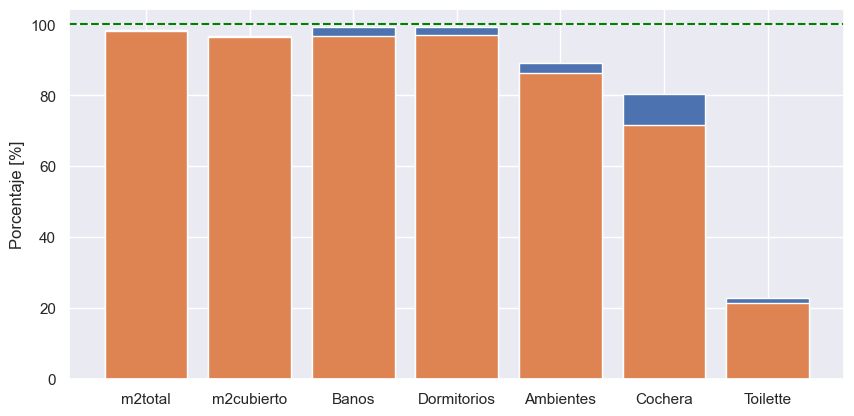

In [20]:
# create data
x = list(diccionario1.keys())
y1 = list(diccionario1.values())
y2 = list(diccionario2.values())
 
# plot bars in stack manner
fig,ax = plt.subplots()

ax.bar(x, y2,label="Description Recovery")
ax.bar(x, y1,label="Initial Data")
plt.axhline(y=100,color="green",linestyle="--")
ax.set_ylabel("Porcentaje [%]")
fig.set_figwidth(10)
plt.show()

---

### Assumptions about the age of properties

Records with "A Estrenar" attribute are imputed by "Antiguedad = 0"

In [21]:
df2.loc[(df2['Estrenar'] == 1) & (df2['Antiguedad'].isnull()), 'Antiguedad'] = 0

### Delete Records without Location

The theoretical models used take in account the geographical location as an essential variable 

In [22]:
df2 = df2.dropna(subset=['barrio','coordenadas.lat','coordenadas.lng'])

---

### Toilette Variable Imputations

Imputation criterion : missing values are imputed by the mode "Toilette = 0"

In [23]:
#Imputamos donde descripción diga Toilette por = 1 (moda)
df2.loc[(df2['Toilette'].isnull()) & (df2['Description'].str.contains('toilette', case=False)), 'Toilette'] = 1

#El resto de los missing de toillete = 0
df2['Toilette'].fillna(0, inplace=True)

---

### Delete records out of Córdoba

In [24]:
df3 = df2.copy()

In [25]:
# Out of Cordoba Records
ids_a_borrar = (42226570,44466736,49480024,49782819,49803813,49803830,49803876,49834200,49046285)
df3 = df3[~df3['idPost'].isin(ids_a_borrar)]

---

### Delete Inchoherent Entries

The next work-rules were defined:

- The number of rooms in a home must be greater than the number of bedrooms it has.

In [26]:
df3.loc[df3['Ambientes'] <= df3['Dormitorios'], 'Ambientes'] = pd.NA

---

- Enrties with "Precio" < U$D 13000 are considered falses and deleted


In [27]:
df3 = df3[df3['Precio'] > 13000]

---

- Homes with less than 20 $m^2$ of total surface area have incorrect information and are therefore discarded

In [28]:
#Imputamos registros recuperables de m2 encontrados durante las tareas de Data-Entry
df3.loc[df3['idPost'] == 47076771 , 'm2total'] = 250
df3.loc[df3['idPost'] == 47076771 , 'm2cubierto'] = 90
df3.loc[df3['idPost'] == 47692656 , 'm2total'] = 180
df3.loc[df3['idPost'] == 47692656 , 'm2cubierto'] = 90
df3.loc[df3['idPost'] == 48398670 , 'm2total'] = 72
df3.loc[df3['idPost'] == 48398670 , 'm2cubierto'] = 72
df3.loc[df3['idPost'] == 49165135 , 'm2cubierto'] = 121

In [29]:
# Filtrar las filas basadas en la columna 'm2total' sin eliminar NaN
df3 = df3[(df3['m2total'] > 29) | df3['m2total'].isna()]

In [30]:
df3 = df3[df3['m2cubierto']>20]

---

- Outliers in the Toilette variable are corrected manually 

In [31]:
#Toilette Outliers
df3[df3['Toilette'] > 3]

,idPost,Precio,title,Description,direccion,barrio,m2total,m2cubierto,Banos,Dormitorios,Ambientes,Antiguedad,Estrenar,Cochera,Estado,Luminoso,Toilette,coordenadas.lat,coordenadas.lng
1957,47438821,160000,Casa Barrio Jardin 3 Dorm.,HDH Propiedades presenta a la venta excelente ...,"Villanueva al 3200, Jardín, Córdoba",Jardín,216.0,140.0,1.0,3.0,5.0,20.0,0,1.0,0,0,11.0,-31.450553,-64.184878
4638,49096492,560000,Cerro de Las Rosas Exclusiva Casa en Venta,Corredor Responsable: Matiaz Ruiz Moreno CPCPI...,"Nicolás Berrotarán 2000, Cerro de las Rosas, C...",Cerro de las Rosas,518.0,518.0,5.0,4.0,9.0,30.0,0,3.0,0,0,4.0,-31.374836,-64.228638
7051,49799604,350000,Venta de Casa en Los Mimbres (Se Recibe Propie...,Corredor Responsable: Roberto Damián Fuentes C...,"Avenida Ciudad de Valparaíso 6600, Centro, Cór...",Centro,250.0,225.0,4.0,3.0,9.0,11.0,0,2.0,0,0,4.0,-31.494633,-64.183928


In [32]:
# ID registro Toilette =11 : 47438821
df3.loc[df3['idPost'] == 47438821 , 'Toilette'] = 1

---

### Correction of Recoverable Records with erroneous coordinates that were identified in Data Entry tasks

Bad coord records: 
- id = 44466962 --> Coordenadas verdaderas = (-31.36823401995691, -64.28239088574453)
- id = 47757741 --> Coordenadas verdaderas = (-31.420922864326357, -64.19379926116024)
- id = 48594329 --> Coordenadas verdaderas = (-31.447647900128846, -64.17826649182237)
- id = 49396311 --> Coordenadas verdaderas = (-31.351706755891197, -64.23327281800529)
- id = 49759033 --> Coordenadas verdaderas = (-31.427039468014726, -64.13805042240658)
- id = 46913213 --> Coordenadas verdaderas = (-31.453505310645546, -64.23235120888539)
- id = 48293936 --> Coordenadas verdaderas = (-31.36703592729202, -64.19570072079256)
- id = 49181233 --> Coordenadas verdaderas = (-31.479416137179047, -64.26703348943975)
- id = 49805619 --> Coordenadas verdaderas = (-31.455141017082113, -64.24497214249807)


In [33]:
lista_id_coord=[44466962,47757741,48594329,49396311,49759033,46913213,48293936,49181233,49805619]
lista_coord=[(-31.36823401995691, -64.28239088574453),(-31.420922864326357, -64.19379926116024),(-31.447647900128846, -64.17826649182237),(-31.351706755891197, -64.23327281800529),(-31.427039468014726, -64.13805042240658),(-31.453505310645546, -64.23235120888539),(-31.36703592729202, -64.19570072079256),(-31.479416137179047, -64.26703348943975),(-31.455141017082113, -64.24497214249807)]

In [34]:
#for ID,coord in zip(lista_id_coord,lista_coord):
#    print(ID , ",",coord[0],",",coord[1])

for ID_coord,coord in zip(lista_id_coord,lista_coord):
    df3.loc[df3['idPost'] == ID_coord , 'coordenadas.lat'] = coord[0]
    df3.loc[df3['idPost'] == ID_coord , 'coordenadas.lng'] = coord[1]

---

### Erroneous "Barrios" Records

Many records were erroneously uploaded indicating the neighborhood as "Córdoba".
Using the reverse-geocoding functionalities offered by the Geopy Library, based on the coordinates of these properties, the neighborhood of many of these records can be recovered.

In [35]:
df3=df3.reset_index(drop=True)

In [36]:
barrcba=df3[df3["barrio"]=="Córdoba"].shape[0]
print(f"Cantidad de registros con Córdoba como barrio: {barrcba}")

Cantidad de registros con Córdoba como barrio: 1048


In [37]:

df3_KNNbarrCBA=df3[df3["barrio"]=="Córdoba"]
indicess=df3_KNNbarrCBA.index
df3_KNNbarrCBA["indices"]=indicess # creo una columna indices para este nuevo dataframe que contiene sólo los registros de Barrio = Cba
df3_KNNbarrCBA=df3_KNNbarrCBA.reset_index(drop=True)


C:\Users\javie\AppData\Local\Temp\ipykernel_9520\3284095458.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3_KNNbarrCBA["indices"]=indicess # creo una columna indices para este nuevo dataframe que contiene sólo los registros de Barrio = Cba


In [38]:
df3_KNNbarrCBA

,idPost,Precio,title,Description,direccion,barrio,m2total,m2cubierto,Banos,Dormitorios,Ambientes,Antiguedad,Estrenar,Cochera,Estado,Luminoso,Toilette,coordenadas.lat,coordenadas.lng,indices
0,41748395,155000,"Propiedad en Desnivel Buena Recepcion, tres Do...","INGRESO A LIVING COMEDOR ,AMBIENTES EN DESNIVE...","IGARZABAL 796, Córdoba, Córdoba",Córdoba,364.0,197.0,2.0,3.0,NaN,55.0,0,NaN,0,0,1.0,-31.440968,-64.205516,8
1,41751462,310000,V. Warcalde en Vta 2340 m² y 238 Cub. Exc,Villa Warcalde 2340 metros2 en venta con una c...,"Maquinchao 10310, Córdoba, Córdoba",Córdoba,2340.0,238.0,2.0,3.0,NaN,8.0,0,NaN,0,0,0.0,-31.330744,-64.308471,14
2,41848290,100000,Silvano Funes (Tamburini 7020) - Venta Casa 3 ...,SILVANO FUNES VENTA CASA 3 DORM. C/GALPÓN. F...,"FRANCISCO TAMBURINI 7020, Córdoba, Córdoba",Córdoba,480.0,95.0,1.0,3.0,NaN,0.0,1,NaN,0,0,0.0,-31.340291,-64.250570,20
3,41974335,60000,"Imperdible Casa 4 Dorm, Pileta, Bº Matienzo","BURO VENDE HERMOSA PROPIEDAD EN Bº MATIENZO, L...","Fleming 3644, Córdoba, Córdoba",Córdoba,233.0,146.0,2.0,4.0,NaN,8.0,0,1.0,0,0,0.0,-31.449754,-64.235851,23
4,42078799,250000,El Refugio Sobre Viracocha en Vta 476 m²,El Refugio sobre calle Viracocha 6752 .. muro ...,"Viracocha 6752, Córdoba, Córdoba",Córdoba,476.0,208.0,2.0,3.0,NaN,20.0,0,NaN,0,0,0.0,-31.342449,-64.277643,27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1043,49897534,145000,"Ncreible Oportunidad, Urbanizacion Las Toscas.",Se venden dúplex a estrenar ubicados en barrio...,"C. LAS TOSCAS S/N, Córdoba, Córdoba",Córdoba,160.0,135.0,3.0,2.0,3.0,0.0,1,1.0,0,0,0.0,-31.420083,-64.188776,7079
1044,49897617,79800,Venta Casa en Alto Alberdi 4 Dorm.,Corredor Responsable: Juan Manuel Quiroga CPCP...,"Juncal 300, Córdoba, Córdoba",Córdoba,190.0,190.0,2.0,4.0,8.0,57.0,0,1.0,0,0,1.0,-31.409652,-64.218508,7082
1045,49897799,150000,"Venta Casa - Villa Cornu, Arguello, Córdoba.",Soys Inmobiliaria te presenta importante propi...,"Av. Chacal y Queupu, Villa Cornu, Córdoba, Cór...",Córdoba,1239.0,300.0,4.0,5.0,9.0,45.0,0,4.0,0,0,0.0,-31.308651,-64.277573,7085
1046,49904706,200000,Granja de Claret Impecable Toda en Planta Baja...,"3 dormitorios, principal en suite con vestidor...",Granja de Claret Impecable Toda en Planta Baja...,Córdoba,440.0,240.0,3.0,3.0,NaN,13.0,0,2.0,0,0,1.0,-31.348964,-64.240470,7093


In [39]:
df4= df3.copy() #Copia de seguridad

#### Reverse-Geocoding Geopy Library

**WARNING** Given the number of records and the limitations of the Nominatim servers to make requests, they must be spaced out in time, which is why Reverse-Geocoding takes a long time to execute (+2 hours).

Due to this, we will attach an Excel with the results it produces for these neighborhoods under the name "DB_Auxiliar_IDS_Barrios.xlsx"

In [40]:
#coordenadas=[]
#for i,r in df3_KNNbarrCBA.iterrows():
#    coordenadas.append((r["coordenadas.lat"],r["coordenadas.lng"]))
#df3_KNNbarrCBA["coordenadas"]=coordenadas

In [41]:
#geocode = RateLimiter(geolocator.reverse, min_delay_seconds=3)

#df3_KNNbarrCBA["geolocaliz"] = df3_KNNbarrCBA["coordenadas"].apply(partial(geocode))

In [42]:
#Creo otra columna con la metadata de la localización descomprimida en formato legible
#df3_KNNbarrCBA["geolocaliz2"]=df3_KNNbarrCBA["geolocaliz"].apply(lambda x : x.raw) 

In [43]:
#Creo otra columna en la cual me quedo solo con la metadata de localización correspondiente a la dirección
#df3_KNNbarrCBA["geolocaliz_direcc"] = df3_KNNbarrCBA["geolocaliz"].apply(lambda x : x.address)

In [44]:

#df3_KNNbarrCBA["barrio2"] = pd.NA

In [45]:
# Reemplazo en el DF original los barrios que decían Córdoba y que el geocoding pudo recuperar
#for i,r in df3_KNNbarrCBA.iterrows():
 #   try:
 #       # Código que puede generar un error
 #       x=r["geolocaliz2"]["address"]
 #       print(i,x["suburb"])
 #       df3_KNNbarrCBA.iloc[i,20]=x["suburb"]  # 20 es la posición de la columna barrio2
 #       df3.loc[df3['idPost'] == r["idPost"] , 'barrio']=x["suburb"]
 #       
 #       pass
 #   except:
 #       # Ignorar el error y continuar con el siguiente ciclo
 #       pass

In [46]:
#df3[(df3["barrio"].notna()) & (df3["barrio"] != "Córdoba")].to_excel("./DB_Auxiliar-IDS_Barrios--V2.xlsx")

#### Reverse-Geocoding Results

In this section we work on the results of Reverse-Geocoding saved in Excel File "DB_Auxiliar-IDS_Barrios.xlsx"

The procedure is to perform a Merge with the DF with which we have been working based on the ID of the publication and subsequently overwrite the data of the original Neighborhood Column

In [47]:
# DataFrame con resultados del Reverse-Geocoding
df_barrios_arreglados= pd.read_excel("../Databases/DB_Auxiliar-IDS_Barrios.xlsx")
#pp.ProfileReport(df_barrios_arreglados)

In [48]:
df3_KNNbarrCBA=df3_KNNbarrCBA.merge(df_barrios_arreglados,on="idPost",how="left")
df3_KNNbarrCBA

,idPost,Precio,title,Description,direccion,barrio_x,m2total,m2cubierto,Banos,Dormitorios,...,Antiguedad,Estrenar,Cochera,Estado,Luminoso,Toilette,coordenadas.lat,coordenadas.lng,indices,barrio_y
0,41748395,155000,"Propiedad en Desnivel Buena Recepcion, tres Do...","INGRESO A LIVING COMEDOR ,AMBIENTES EN DESNIVE...","IGARZABAL 796, Córdoba, Córdoba",Córdoba,364.0,197.0,2.0,3.0,...,55.0,0,NaN,0,0,1.0,-31.440968,-64.205516,8,Parque Vélez Sarsfield
1,41751462,310000,V. Warcalde en Vta 2340 m² y 238 Cub. Exc,Villa Warcalde 2340 metros2 en venta con una c...,"Maquinchao 10310, Córdoba, Córdoba",Córdoba,2340.0,238.0,2.0,3.0,...,8.0,0,NaN,0,0,0.0,-31.330744,-64.308471,14,Alto Hermoso
2,41848290,100000,Silvano Funes (Tamburini 7020) - Venta Casa 3 ...,SILVANO FUNES VENTA CASA 3 DORM. C/GALPÓN. F...,"FRANCISCO TAMBURINI 7020, Córdoba, Córdoba",Córdoba,480.0,95.0,1.0,3.0,...,0.0,1,NaN,0,0,0.0,-31.340291,-64.250570,20,Silvano Funes
3,41974335,60000,"Imperdible Casa 4 Dorm, Pileta, Bº Matienzo","BURO VENDE HERMOSA PROPIEDAD EN Bº MATIENZO, L...","Fleming 3644, Córdoba, Córdoba",Córdoba,233.0,146.0,2.0,4.0,...,8.0,0,1.0,0,0,0.0,-31.449754,-64.235851,23,René Favaloro Sud
4,42078799,250000,El Refugio Sobre Viracocha en Vta 476 m²,El Refugio sobre calle Viracocha 6752 .. muro ...,"Viracocha 6752, Córdoba, Córdoba",Córdoba,476.0,208.0,2.0,3.0,...,20.0,0,NaN,0,0,0.0,-31.342449,-64.277643,27,Argüello
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1043,49897534,145000,"Ncreible Oportunidad, Urbanizacion Las Toscas.",Se venden dúplex a estrenar ubicados en barrio...,"C. LAS TOSCAS S/N, Córdoba, Córdoba",Córdoba,160.0,135.0,3.0,2.0,...,0.0,1,1.0,0,0,0.0,-31.420083,-64.188776,7079,NaN
1044,49897617,79800,Venta Casa en Alto Alberdi 4 Dorm.,Corredor Responsable: Juan Manuel Quiroga CPCP...,"Juncal 300, Córdoba, Córdoba",Córdoba,190.0,190.0,2.0,4.0,...,57.0,0,1.0,0,0,1.0,-31.409652,-64.218508,7082,Alto Alberdi
1045,49897799,150000,"Venta Casa - Villa Cornu, Arguello, Córdoba.",Soys Inmobiliaria te presenta importante propi...,"Av. Chacal y Queupu, Villa Cornu, Córdoba, Cór...",Córdoba,1239.0,300.0,4.0,5.0,...,45.0,0,4.0,0,0,0.0,-31.308651,-64.277573,7085,Villa Cornú
1046,49904706,200000,Granja de Claret Impecable Toda en Planta Baja...,"3 dormitorios, principal en suite con vestidor...",Granja de Claret Impecable Toda en Planta Baja...,Córdoba,440.0,240.0,3.0,3.0,...,13.0,0,2.0,0,0,1.0,-31.348964,-64.240470,7093,Granja de Funes


In [49]:
df4

,idPost,Precio,title,Description,direccion,barrio,m2total,m2cubierto,Banos,Dormitorios,Ambientes,Antiguedad,Estrenar,Cochera,Estado,Luminoso,Toilette,coordenadas.lat,coordenadas.lng
0,33042376,370000,Casa 4 Dorm. - Cerro de Las Rosas - Pasaje a 1400,Excelente propiedad ubicada en pleno Cerro de ...,"Pasaje A , Cerro de las Rosas, Córdoba",Cerro de las Rosas,505.0,377.0,3.0,4.0,5.0,10.0,0,2.0,1,0,1.0,-31.434370,-64.221985
1,41364381,300000,Venta. Casa de Tres Dorm. en Tejas 3,"VENTA. Casa de tres dormitorios en Tejas 3, co...","Tejas , Nobu Town, Córdoba",Nobu Town,540.0,250.0,3.0,3.0,4.0,5.0,0,2.0,1,0,0.0,-31.441045,-64.312823
2,41461505,400000,A. Centeno - Venta Casa 6 Dorm.,ALEJANDRO CENTENO VENTA CASA 6 DORMITORIOS C...,"CLAUDIO DE ARREDONDO 4524, Alejandro Centeno, ...",Alejandro Centeno,875.0,513.0,4.0,6.0,NaN,22.0,0,2.0,0,0,0.0,-31.362630,-64.232827
3,41461516,100000,La France - Venta Casa 2 Dorm.,LA FRANCE VENTA CASA 2 DORMITORIOS CURUPAYTI...,"CURUPAYTI 3512, La France, Córdoba",La France,225.0,196.0,1.0,2.0,NaN,0.0,1,NaN,0,0,0.0,-31.372539,-64.207983
4,41555405,67000,Casa en Venta 2 Dorm. Pque San Vicente A. Garz...,CASA DE EN VENTA EN BARRIO PARQUE SAN VICENTE ...,"AGUSTIN GARZON 3455, Parque San Vicente, Córdoba",Parque San Vicente,228.0,115.0,1.0,2.0,4.0,61.0,0,1.0,0,0,0.0,-31.426211,-64.140085
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7106,49912136,85000,Casa - Cordoba Capital,López Baena ofrece casa a estrenar en villa C...,"Villa Catalina, Córdoba, Córdoba",Córdoba,300.0,70.0,1.0,2.0,NaN,0.0,1,NaN,0,0,0.0,-31.420083,-64.188776
7107,49912173,119000,San Ignacio Village Duplex en Venta de 3 Dorm....,"San Ignacio Village, Av.Armada Argentina, sobr...","armada argentina 5700, San Ignacio Village, Có...",San Ignacio Village,180.0,145.0,2.0,3.0,4.0,0.0,1,2.0,0,0,1.0,-31.396179,-64.141322
7108,49912349,38999,Casa 2 Dor Patio Cochera + Local - Rene Favaloro,Corredor Responsable: Mariana Carrizo CPCPI 52...,"Fleming 3400, Matienzo, Córdoba",Matienzo,109.0,94.0,2.0,2.0,3.0,13.0,0,2.0,0,0,0.0,-31.448101,-64.235964
7109,49912364,30000,Casa 3 Dorm. Bo Bella Vista Oeste a 150 Mtrs d...,VENDO CASA UBICADA SOBRE CALLE MISIONES 1583 B...,"Misiones 1583, Bella Vista Oeste, Córdoba",Bella Vista Oeste,230.0,80.0,1.0,3.0,6.0,70.0,0,1.0,0,0,0.0,-31.430724,-64.208298


In [50]:
for i,r in df3_KNNbarrCBA.iterrows():
    df4.iloc[r["indices"],5]=r["barrio_y"]

---

In [51]:
df5=df4.copy()

In [52]:
barrio_counts = df5['barrio'].value_counts()
barrio_counts.head(20)

barrio
Villa Belgrano          300
Argüello                263
Cerro de las Rosas      210
URCA                    192
Valle Escondido         148
Alta Córdoba            123
Jardín                  122
Alto Alberdi            119
Manantiales             112
Villa Rivera Indarte    107
Greenville II           106
Villa Warcalde          104
Colón                   102
Lomas de la Carolina     98
Centro                   94
Chacra del Norte         89
Claros del Bosque        84
Los Boulevares           84
Jardín Espinosa          79
Poeta Lugones            76
Name: count, dtype: int64

### New Neighbours Variables Creation

To evaluate the impact of the neighborhood where the property belongs to on its price, we create new Boolean variables corresponding to the neighborhoods with the most properties for sale, which we consider to be the most in demand/desired.

In [53]:
# Filtrar categorías con más de 90 datos asignados
categorias_mas_de_90 = barrio_counts[barrio_counts > 90].index.tolist()

# Crear nuevas columnas para cada categoría y llenarlas con valores booleanos
for categoria in categorias_mas_de_90:
    df5[categoria] = (df5['barrio'] == categoria).astype(int)

---

### New Boolean Variables that we consider relevant from keywords in the Description column

We will use all these variables in order to provide more information on the properties for imputations by the K-Nearest Neighbor algorithm

In turn, we will consider some of these Boolean variables relevant to appraise real estate.

In [54]:
#Defino palabras clave que sirvan como nuevas variables del dataframe

#Algunas como "lavadero" o "escritorio" no son relevantes para el modelo predictivo quizás, pero las necesito ahora como variables
#contextuales para imputar mejor la variable ambientes.

newfields_label_KNN = ["country" , "living" , "duplex", "quincho", "escritura","quinta","terraza","escritorio","lavadero","asador","galeria","pileta","piscina","balcon","pa","demoler","reciclar", "oportunidad"]
newfields_label_KNN2= ["barrio cerrado","planta alta"]

In [55]:
df5["Description"]=df5["Description"].fillna(" ")
df5=df5.reset_index(drop=True)

In [56]:
#Busco las palabras usando variable "Description". Posteriormente las guardo en un diccionario. A partir del cual las agrego al D

dic_fiels = {}

for campos in newfields_label_KNN:
    a= np.zeros(shape=df5.shape[0])
    for indice, des in zip(df5.index , df5["Description"].values):
        listapalabras = procesado_texto(des,lista_no_deseados)
        k=0
        for pal in listapalabras:
            if (pal == campos):
                k=k+1
        if (k != 0):
            a[indice]=1
    dic_fiels[campos] = a



for campos in newfields_label_KNN2:
    a= np.zeros(shape=df5.shape[0])
    for indice, des in zip(df5.index , df5["Description"].values):
        listapalabras = procesado_texto(des,lista_no_deseados)
        descrip_procesada= " ".join(listapalabras)
        k= descrip_procesada.find(campos)
        if (k != -1):
            a[indice]=1
    dic_fiels[campos] = a

In [57]:
for ke,val in dic_fiels.items():
    print(ke , "=" , val.sum())

country = 509.0
living = 5484.0
duplex = 1244.0
quincho = 1525.0
escritura = 1238.0
quinta = 16.0
terraza = 842.0
escritorio = 1398.0
lavadero = 2775.0
asador = 3944.0
galeria = 2583.0
pileta = 2003.0
piscina = 379.0
balcon = 580.0
pa = 218.0
demoler = 22.0
reciclar = 126.0
oportunidad = 971.0
barrio cerrado = 294.0
planta alta = 2500.0


In [58]:
for s in dic_fiels.items():
    df5[s[0]]=s[1]

df5


,idPost,Precio,title,Description,direccion,barrio,m2total,m2cubierto,Banos,Dormitorios,...,galeria,pileta,piscina,balcon,pa,demoler,reciclar,oportunidad,barrio cerrado,planta alta
0,33042376,370000,Casa 4 Dorm. - Cerro de Las Rosas - Pasaje a 1400,Excelente propiedad ubicada en pleno Cerro de ...,"Pasaje A , Cerro de las Rosas, Córdoba",Cerro de las Rosas,505.0,377.0,3.0,4.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
1,41364381,300000,Venta. Casa de Tres Dorm. en Tejas 3,"VENTA. Casa de tres dormitorios en Tejas 3, co...","Tejas , Nobu Town, Córdoba",Nobu Town,540.0,250.0,3.0,3.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,41461505,400000,A. Centeno - Venta Casa 6 Dorm.,ALEJANDRO CENTENO VENTA CASA 6 DORMITORIOS C...,"CLAUDIO DE ARREDONDO 4524, Alejandro Centeno, ...",Alejandro Centeno,875.0,513.0,4.0,6.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,41461516,100000,La France - Venta Casa 2 Dorm.,LA FRANCE VENTA CASA 2 DORMITORIOS CURUPAYTI...,"CURUPAYTI 3512, La France, Córdoba",La France,225.0,196.0,1.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,41555405,67000,Casa en Venta 2 Dorm. Pque San Vicente A. Garz...,CASA DE EN VENTA EN BARRIO PARQUE SAN VICENTE ...,"AGUSTIN GARZON 3455, Parque San Vicente, Córdoba",Parque San Vicente,228.0,115.0,1.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7106,49912136,85000,Casa - Cordoba Capital,López Baena ofrece casa a estrenar en villa C...,"Villa Catalina, Córdoba, Córdoba",Villa Catalina,300.0,70.0,1.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7107,49912173,119000,San Ignacio Village Duplex en Venta de 3 Dorm....,"San Ignacio Village, Av.Armada Argentina, sobr...","armada argentina 5700, San Ignacio Village, Có...",San Ignacio Village,180.0,145.0,2.0,3.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7108,49912349,38999,Casa 2 Dor Patio Cochera + Local - Rene Favaloro,Corredor Responsable: Mariana Carrizo CPCPI 52...,"Fleming 3400, Matienzo, Córdoba",Matienzo,109.0,94.0,2.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7109,49912364,30000,Casa 3 Dorm. Bo Bella Vista Oeste a 150 Mtrs d...,VENDO CASA UBICADA SOBRE CALLE MISIONES 1583 B...,"Misiones 1583, Bella Vista Oeste, Córdoba",Bella Vista Oeste,230.0,80.0,1.0,3.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


---

### KNN Imputation Algorithm for Missing Data

In [59]:
# Columnas de interes para el KNN

lista_columnas_todoDF=list(df5.columns)
set_columnas_qNOquiero=set(["Luminoso","Estado","Estrenar","Description","direccion","title","idPost","Precio","barrio","Antiguedad","coordenadas.lat","coordenadas.lng","duplex","quincho","escritura","quinta","terraza","asador","galeria","balcon","barrio cerrado","pileta","piscina",'demoler', 'reciclar',"oportunidad"])

In [60]:
#set_columnas_qSIquiero=set_columnas_todoDF - set_columnas_qNOquiero
lista_columnas_qSIquiero=[]
for i in lista_columnas_todoDF:
    if i in set_columnas_qNOquiero:
        pass
    else:
        lista_columnas_qSIquiero.append(i)
        print(i)

lista_columnas=lista_columnas_qSIquiero

m2total
m2cubierto
Banos
Dormitorios
Ambientes
Cochera
Toilette
Villa Belgrano
Argüello
Cerro de las Rosas
URCA
Valle Escondido
Alta Córdoba
Jardín
Alto Alberdi
Manantiales
Villa Rivera Indarte
Greenville II
Villa Warcalde
Colón
Lomas de la Carolina
Centro
country
living
escritorio
lavadero
pa
planta alta


In [61]:
df_KNN_aux = df5[lista_columnas]
# Esto lo puse porque se ve que al usar los nombres de barrios tiene problemas con los que se llaman tipo "16 de septiembre" o "1 de mayo"
df_KNN_aux.columns = df_KNN_aux.columns.astype(str)

In [62]:
from sklearn.impute import KNNImputer

In [63]:
knnimp=KNNImputer(n_neighbors=2)
val_imputado=knnimp.fit_transform(df_KNN_aux)

val_imputado = (np.rint(val_imputado)).astype(int)
indices=df_KNN_aux.index
df_KNN_aux=pd.DataFrame(val_imputado, columns=lista_columnas,index=indices)

#
for i in lista_columnas:
    df5[i] = df_KNN_aux[i].values

---

### Evaluation of the results of KNN Imputations

We seek to ensure that the imputations made do not alter the qualitative forms of the data that are already available.
We present Histograms Before and After imputation to verify this working hypothesis.

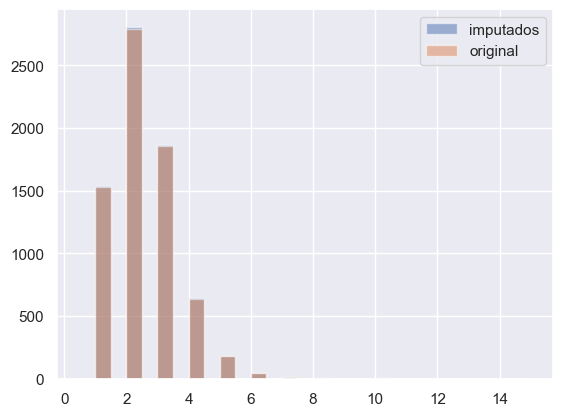

In [64]:
x1 = df5["Banos"]
x2 = df3["Banos"]
binss= np.arange(x1.min()-0.5,x1.max()+0.5+1,0.5)
plt.hist(x1, bins=binss, alpha=0.5,label="imputados")
plt.hist(x2, bins=binss, alpha=0.5,label="original")
plt.legend(loc='upper right')
plt.show()

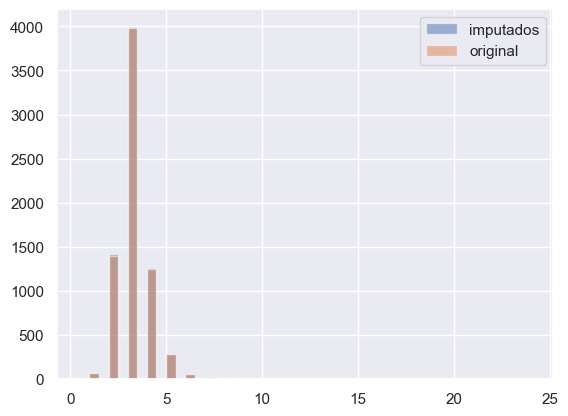

In [65]:
x1 = df5["Dormitorios"]
x2 = df3["Dormitorios"]
binss= np.arange(x1.min()-0.5,x1.max()+0.5+1,0.5)
plt.hist(x1, bins=binss, alpha=0.5,label="imputados")
plt.hist(x2, bins=binss, alpha=0.5,label="original")
plt.legend(loc='upper right')
plt.show()

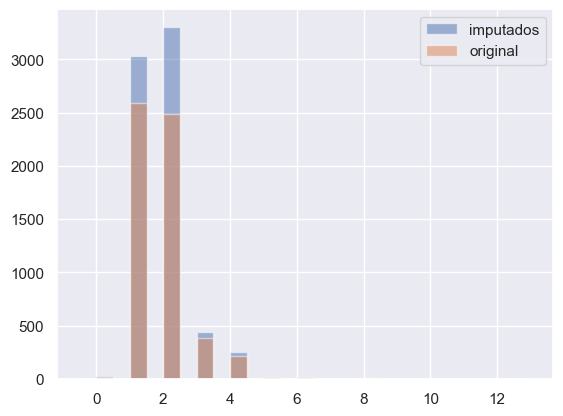

In [66]:
x1 = df5["Cochera"]
x2 = df3["Cochera"]
binss= np.arange(x1.min()-0.5,x1.max()+0.5+1,0.5)
plt.hist(x1, bins=binss, alpha=0.5,label="imputados")
plt.hist(x2, bins=binss, alpha=0.5,label="original")
plt.legend(loc='upper right')
plt.show()

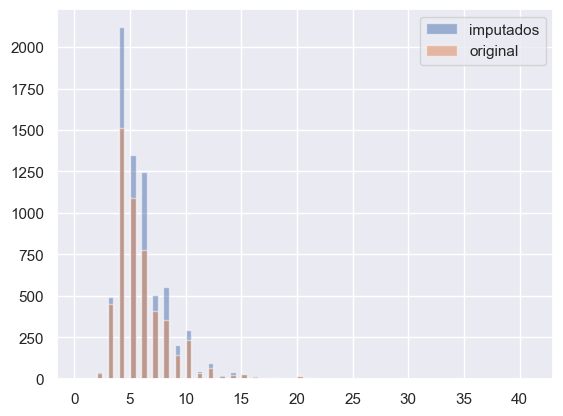

In [67]:
x1 = df5["Ambientes"]
x2 = df3["Ambientes"]
binss= np.arange(x1.min()-0.5,x1.max()+0.5+1,0.5)
plt.hist(x1, bins=binss, alpha=0.5,label="imputados")
plt.hist(x2, bins=binss, alpha=0.5,label="original")
plt.legend(loc='upper right')
plt.show()

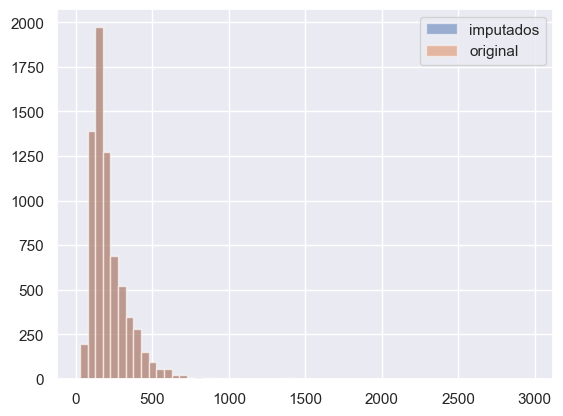

In [68]:
x1 = df5["m2cubierto"]
x2 = df3["m2cubierto"]
binss= np.arange(x1.min(),3000,50)
plt.hist(x1,bins=binss, alpha=0.5,label="imputados")
plt.hist(x2,bins=binss, alpha=0.5,label="original")
plt.legend(loc='upper right')
plt.show()

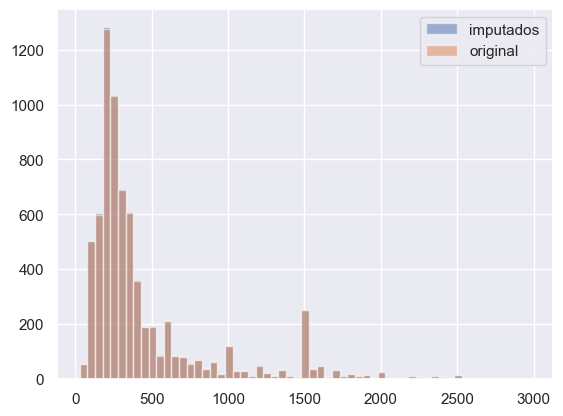

In [69]:
x1 = df5["m2total"]
x2 = df3["m2total"]
binss= np.arange(x1.min(),3000,50)
plt.hist(x1,bins=binss, alpha=0.5,label="imputados")
plt.hist(x2,bins=binss, alpha=0.5,label="original")
plt.legend(loc='upper right')
plt.show()

---

### Fixing some variables

- Instead of considering, for example, "pileta" and "piscina" as 2 independent Boolean variables, we take them as a single unified variable "pileta-piscina". Same for "planta alta"

- In addition, we will consider that the house has a patio/garden if the covered area is less than 90% of the total surface area of the house's land.


In [70]:
lista_pileta=[]
lista_patio=[]
lista_planta_alta=[]
for i,r in df5.iterrows():
    if (r["pileta"] == 1) | (r["piscina"] == 1):
        lista_pileta.append(1)
    else:
        lista_pileta.append(0)

    if (r["m2cubierto"] < 0.90*r["m2total"] ):
        lista_patio.append(1)
    else:
        lista_patio.append(0)

    if (r["planta alta"] == 1) | (r["pa"] == 1):
        lista_planta_alta.append(1)
    else:
        lista_planta_alta.append(0)

df5["pileta_piscina"] = lista_pileta
df5["patio_jardin"] = lista_patio
df5["plantaalta_pa"] = lista_planta_alta

In [71]:
df6=df5.drop(["direccion","barrio","pileta","piscina","Estrenar","Estado","Luminoso","title","Description","pa","planta alta"],axis=1)

---
---

### Restriction to properties located in the City of Córdoba - Quantitative

For this purpose we need to define what we consider as the city of Córdoba and its surroundings? To do this, we define a polygon that delimits the border of what we consider Córdoba using the website [www.geojson.io](https://geojson.io/#map=11.8/-31.40553/-64.19195)

This allows you to create a Geojson file, with the city limits

The Geopy and Geopandas Geolocation libraries allow determining the belonging of a property to said area.

Note: Geojson is the analogue of JSON, the universal format for geospatial data exchange

In [72]:
coordenadas = []
for i,r in df6.iterrows():
    coord= (r["coordenadas.lat"],r["coordenadas.lng"])
    coordenadas.append(coord)

df6["coordenadas"]=coordenadas

In [75]:
gdf = gpd.read_file('../map2.geojson')

en_cordoba=[]

# Determinamos si un inmueble pertenece o no a córdoba capital, utilizando una variable booleana nueva
for i,r in df6.iterrows():
    point = Point(r["coordenadas.lng"],r["coordenadas.lat"])  # OJO, PRIMERO VA LONGITUD Y DESPUÉS LATITUD
    if gdf.geometry.contains(point).any():
        x=True
        en_cordoba.append(x)
    else:
        x=False
        en_cordoba.append(x)


In [76]:
df6["en_cordoba"]=en_cordoba
df6[df6["en_cordoba"]==True]

,idPost,Precio,m2total,m2cubierto,Banos,Dormitorios,Ambientes,Antiguedad,Cochera,Toilette,...,balcon,demoler,reciclar,oportunidad,barrio cerrado,pileta_piscina,patio_jardin,plantaalta_pa,coordenadas,en_cordoba
0,33042376,370000,505,377,3,4,5,10.0,2,1,...,1.0,0.0,0.0,0.0,0.0,1,1,1,"(-31.43437004, -64.22198486)",True
1,41364381,300000,540,250,3,3,4,5.0,2,0,...,0.0,0.0,0.0,0.0,0.0,0,1,0,"(-31.4410448, -64.3128234)",True
2,41461505,400000,875,513,4,6,6,22.0,2,0,...,0.0,0.0,0.0,0.0,0.0,1,1,1,"(-31.36263, -64.2328272)",True
3,41461516,100000,225,196,1,2,8,0.0,2,0,...,0.0,0.0,0.0,0.0,0.0,0,1,0,"(-31.3725395, -64.207983)",True
4,41555405,67000,228,115,1,2,4,61.0,1,0,...,0.0,0.0,0.0,0.0,0.0,0,1,0,"(-31.426211, -64.1400854)",True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7106,49912136,85000,300,70,1,2,3,0.0,1,0,...,0.0,0.0,0.0,0.0,0.0,0,1,0,"(-31.4200833, -64.1887761)",True
7107,49912173,119000,180,145,2,3,4,0.0,2,1,...,0.0,0.0,0.0,0.0,0.0,0,1,0,"(-31.3961786, -64.1413223)",True
7108,49912349,38999,109,94,2,2,3,13.0,2,0,...,0.0,0.0,0.0,0.0,0.0,0,1,0,"(-31.4481012, -64.2359638)",True
7109,49912364,30000,230,80,1,3,6,70.0,1,0,...,0.0,0.0,0.0,0.0,0.0,0,1,0,"(-31.4307238, -64.2082975)",True


In [77]:
#Restricción a Zona Córdoba Capital
df7=df6[df6["en_cordoba"]==True]

---
---

## Final DF export after cleaning for analysis and modeling

**Nota** Descomentar la linea puede sobreescribir el archivo ya existente en el Directorio, cambiar nombre cualquier cosa

In [78]:
df7.to_excel("../Databases/DB_Modeling.xlsx",index=False)

---
---

## Extra - Distribución de los inmuebles dentro de la zona de Córdoba Capital

Representación gráfica de las distirbuciones de precios de los inmuebles dada su ubicación. Encontramos al noroeste y al sur zonas de precios más altos por ejemplo

In [77]:
gdf_trabajo = gpd.GeoDataFrame(
    df7, geometry=gpd.points_from_xy(df7["coordenadas.lng"], df7["coordenadas.lat"]), crs="EPSG:4326"
)

gdf_trabajo2=gdf_trabajo[gdf_trabajo["en_cordoba"]==True]

gdf_trabajo["Precio"] = gdf_trabajo["Precio"].astype(int)


<AxesSubplot: >

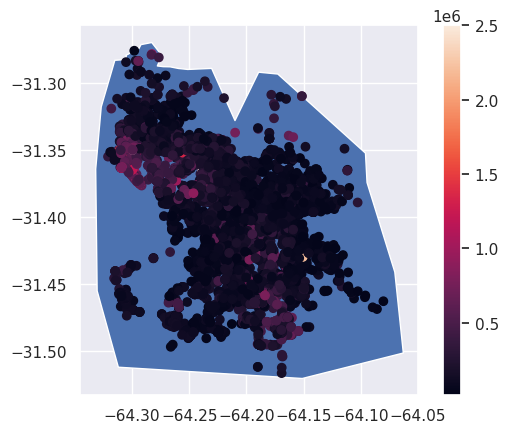

In [78]:
axis=gdf["geometry"].plot()
gdf_trabajo2.plot(ax=axis,column="Precio",legend=True)